# Tropical Tree Cover
## Detecting tree cover gain and loss at a 10-meter resolution in dry forests in Jalisco and Yucatán for 2017 to 2022



1. Background
2. Area of interest
3. Image acquisition
4. Cloud and cloud shadow detection
5. Cloud and cloud shadow removal
6. Super-resolving Sentinel bands to 10-meterrs
7. Generating analysis-ready Sentinel-2 and Sentinel-1 data
8. Loading and running the Tensorflow model to generate predictions
9. Visualizing predictions
10. Mosaicing multiple tiles to generate geotiff

# Technical Stack

We deploy this pipeline on Amazon Web Services using Docker. The Dockerfile can be seen [here](https://github.com/wri/sentinel-tree-cover/blob/master/Dockerfile) and the bash command to build and deploy [here](https://github.com/wri/sentinel-tree-cover/blob/master/docker_setup.sh).

We utilize Sentinel-hub to acquire Sentinel-1 and Sentinel-2 images. This is because, at a continental/tropical scale, we need access to dozens of computers to acquire imagery in parallel. The code and examples that you will see below can also be applied to a stack of multitemporal images exported from Google Earth Engine by e.g. following [this guide](https://developers.google.com/earth-engine/guides/exporting).

While Amazon Web Services are used to parallelize this process across many computers, the whole pipeline can process ~80,000 ha / hour on a laptop.

# Contextual considerations

This example focuses on tropical dry forests in Jalisco and in Yucatán. These dry forests are especially difficult to analyze due to seasonal differences in vegetation phenology and the high average cloud cover.

Also, understanding the total vegetation dynamic (loss and gain) is important for identifying rotational logging and plantation expansion.

This is not an early warning system, it is an annual product. However, the underlying methods (e.g. cloud removal, superresolution, image normalization) can be applied to EWS methodologies.

First, we'll start by looking at some contextual needs for remote sensing in tropical dry forests.

[Google Earth Engine App Link](https://jombrandt.users.earthengine.app/view/sentinel-tree-cover)

- Dr Rodulfo Figueroa la, Chis., Mexico


# Example

In [24]:
# Load packages, define visualization function
import numpy as np
import tensorflow as tff
import rasterio as rs
import hickle as hkl

from PIL import Image
from IPython.display import display
from skimage.transform import resize
import seaborn as sns
from matplotlib import pyplot as plt
from IPython.display import Image as IImage

def arr_to_rgb(arr):
    ls = []
    for i in range(arr.shape[0]):
        l = np.copy(arr[i])
        l_red = np.copy(l[..., 2])
        l_blue = np.copy(l[..., 0])
        l[..., 0] = l_red
        l[..., 2] = l_blue
        l = np.clip(l, 0, np.percentile(l, 98, axis = (0, 1)))
        maxes = np.array(np.max(l, axis = (0, 1)))
        l = l / maxes
        l = Image.fromarray((l * 255).astype(np.uint8), 'RGB')
        ls.append(l)
    return ls

In [30]:
YEAR = 2020

folder_path = f"../../project-monitoring/tiles/{str(YEAR)}/386/1340/"
#folder_path = f"../../project-monitoring/tiles/{str(YEAR)}/2377/900/"
sentinel2 = hkl.load(f"{folder_path}raw/s2_10/386X1340Y.hkl") / 65535
#sentinel2_20 = hkl.load(f"{folder_path}raw/s2_20/117X1317Y.hkl") / 65535
clouds = np.load(f"{folder_path}clouds.npy")
analysisready = np.load(f"{folder_path}smooth.npy") / 65535

# Area of interest 1: Tree cover gain in Jalisco

The first area we will be considering is a dry forest and agricultural landscape in Jalisco, which has experienced some deforestation and expansion of tree plantations recently. We will show the creation of annual data to detect change in tree cover.

<img src="conafor/jalisco.gif" width="900" align="left">

# Area of interest 2: Tree cover loss in Yucatán

<img src="conafor/yucatanchange.png" width="750" align="left">



# 2017 to 2022 cloudy images

<img src="conafor/sixyear_cloudy.gif" width="750" align="left">

# Cloud and cloud shadow detection

- Utilize [Hollstein et al. (2016)](https://www.mdpi.com/2072-4292/8/8/666) to generate baseline cloud-free composites per season
- Utilize cloud-free seasonal composites as "reference" images to generate high-quality, per-image cloud and cloud-shadow masks with [Candra et al. (2019)](https://www.tandfonline.com/doi/full/10.1080/01431161.2019.1697006)
- Utilize Fmask 4.0's [methods](https://www.sciencedirect.com/user/identity/landing?code=hU5nS_iiuYlDlYUB4-28wVg5Kck1Ff0GsGUk3M0a&state=retryCounter%3D0%26csrfToken%3Dc3394eb3-66ac-42a8-9108-c34d926fe2fe%26idpPolicy%3Durn%253Acom%253Aelsevier%253Aidp%253Apolicy%253Aproduct%253Ainst_assoc%26returnUrl%3D%252Fscience%252Farticle%252Fpii%252FS0034425718302037%26prompt%3Dnone%26cid%3Darp-342a7e15-ccf1-4035-8f19-a81e954ff9aa) for false positive removal on bright surfaces, though we apply this conservatively since bright surfaces (e.g. green houses, buildings, snow, sand) will not have tree cover.
- The cloud/cloud shadow detection is designed to have more false positives than false negatives, since false positives can be corrected with when generating the analysis ready data, but false negatives are unable to be corrected.

# Cloud and cloud shadow removal and interpolation

This code is available [here](https://github.com/wri/sentinel-tree-cover/blob/master/src/download_and_predict_job_fast.py#L558)

It takes as input `sentinel2`, a `(TIME, X, Y, 10 BAND)` 10- and 20-meter Sentinel-2 image stack, `dem` a slope derived from DEM, and `bbox`, the bounding box of the AOI.


This is run as:

```python
cloudshad, fcps = cloud_removal.identify_clouds_shadows(sentinel2, dem, bbx)
```

This returns `cloudshad`, the predicted locations of clouds and shadows, and `fcps` which are the potential false positive pixels.



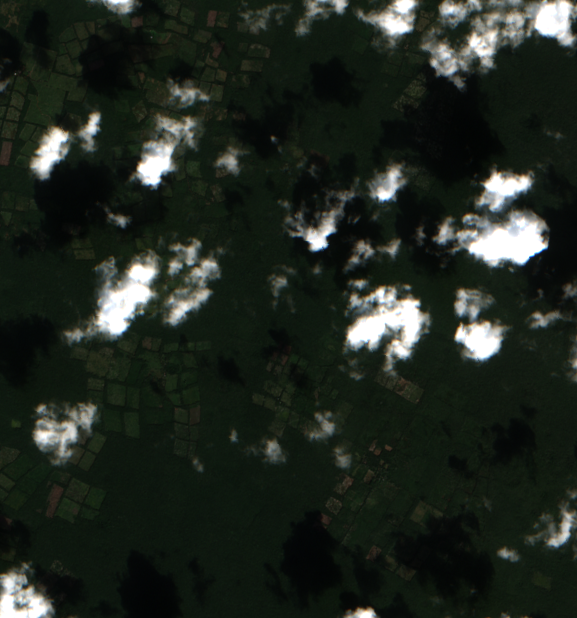
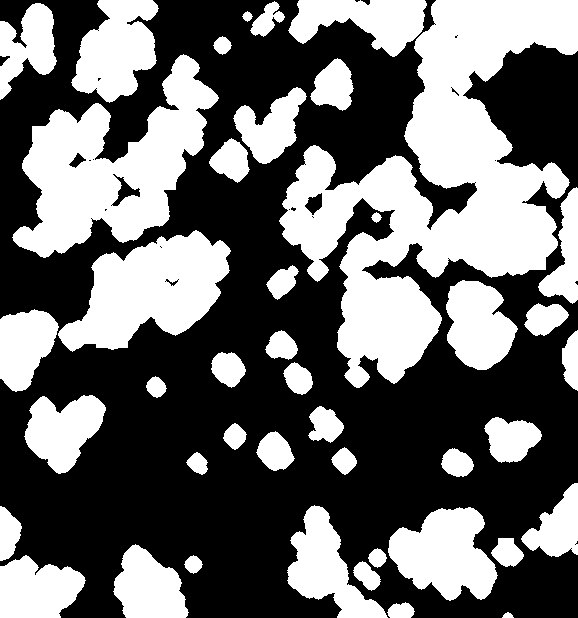
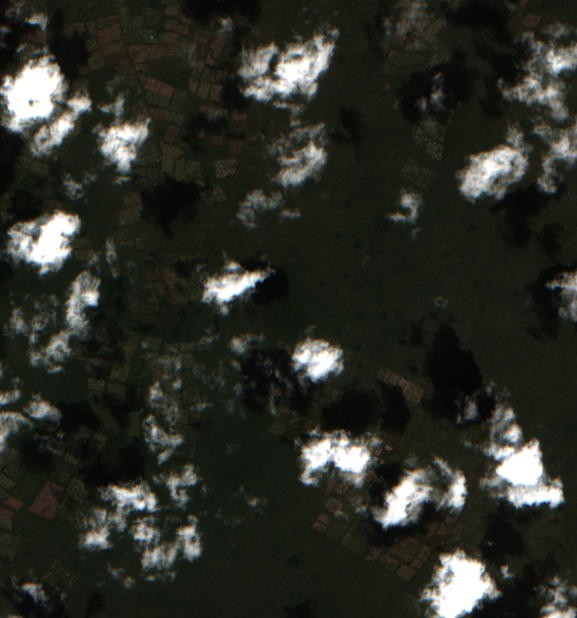
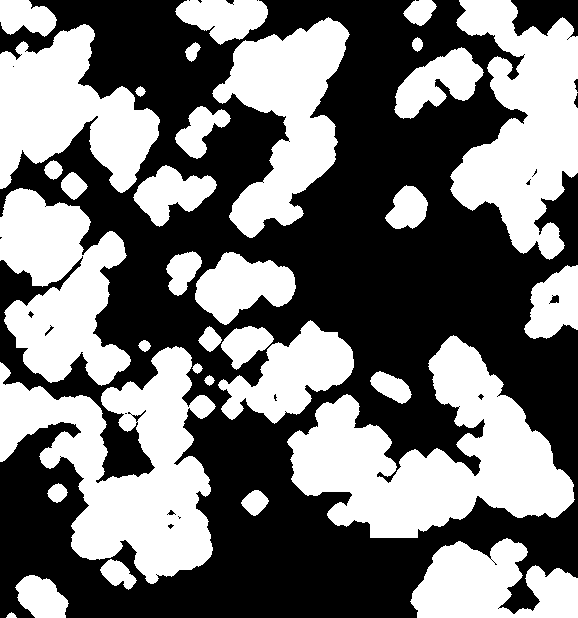
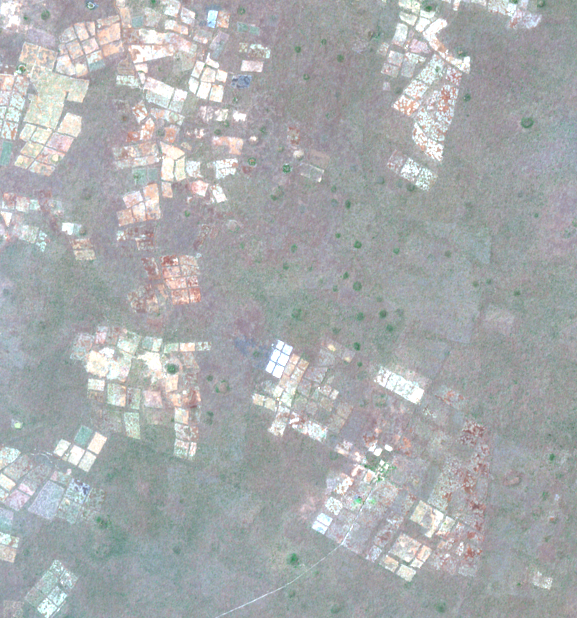
...
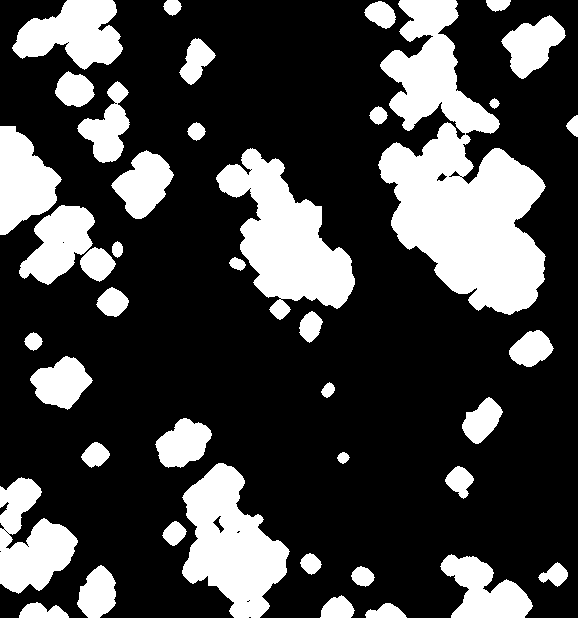
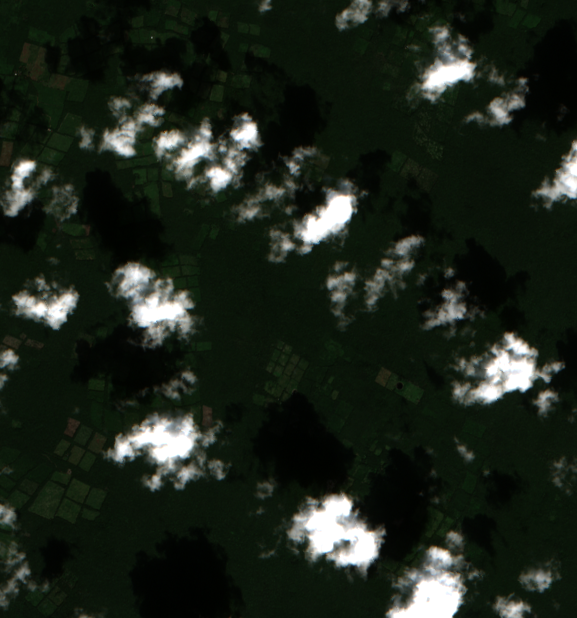
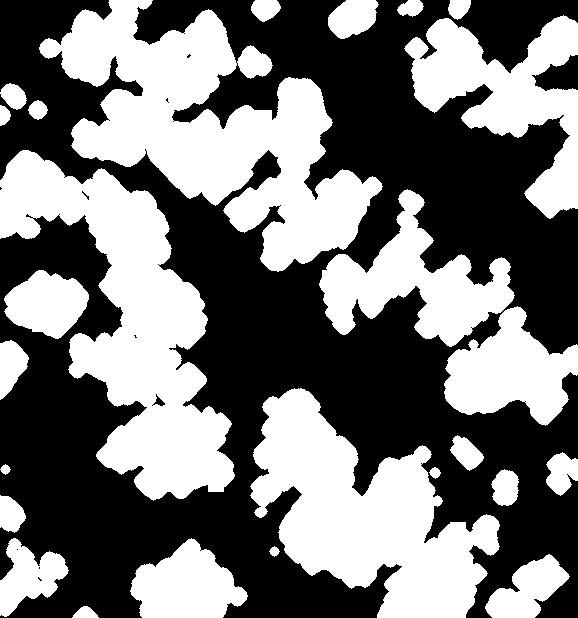
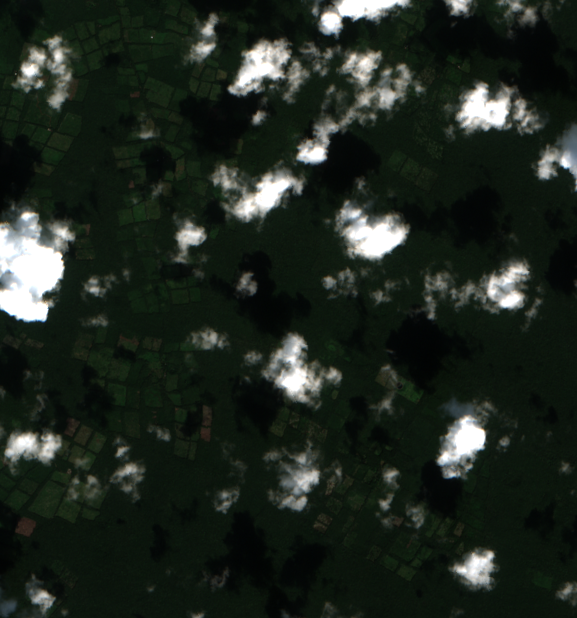
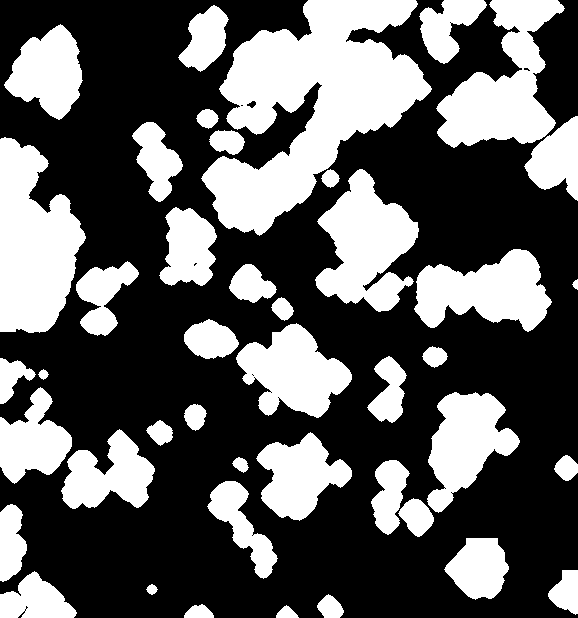

In [33]:
import ipyplot
to_plot = []
ls = arr_to_rgb(sentinel2[..., :3])
for i in range(clouds.shape[0]):
    to_plot.append(ls[i])
    to_plot.append(clouds[i] * 255)
ipyplot.plot_images(to_plot, max_images=20, img_width=325)

# 2017 to 2022 cloud-free analysis-ready images

The clouds and cloud shadows are removed by a) generating a cloud-free composite, b) replacing cloudy pixels with respective pixels from the composite, and c) conducting relative radiometric normalization between the replaced pixels and the non-replaced pixels.

The code for this can be found [here](https://github.com/wri/sentinel-tree-cover/blob/master/src/download_and_predict_job_fast.py#L579).

To create a cloud-free composite, we average all non-cloudy pixels multiplied by a distance map, weighting pixels further away from clouds higher. We then directly replace all `cloud` pixels with the respective `composite` pixel. This effectively copies the "object" structure from the composite image, but seasonal effects are still present. To mitigate this, we conduct relative radiometric normalization between the `reference` image (the non-cloud pixels in image *i*) and the `source` image (the pixels replaced by `composite`).

This relative radiometric normalization can be done either with multiple linear regression or by adjusting based on per-band standard deviation and mean. We do the latter, as defined [here](https://github.com/wri/sentinel-tree-cover/blob/42f6106d1fe8c1952f9fceca2276a9327bbe5eb0/src/preprocessing/cloud_removal.py#L315).


```python
sentinel2, interp = cloud_removal.remove_cloud_and_shadows(
                sentinel2, 
                cloudshad,
                image_dates, 
                pfcps
            )

```


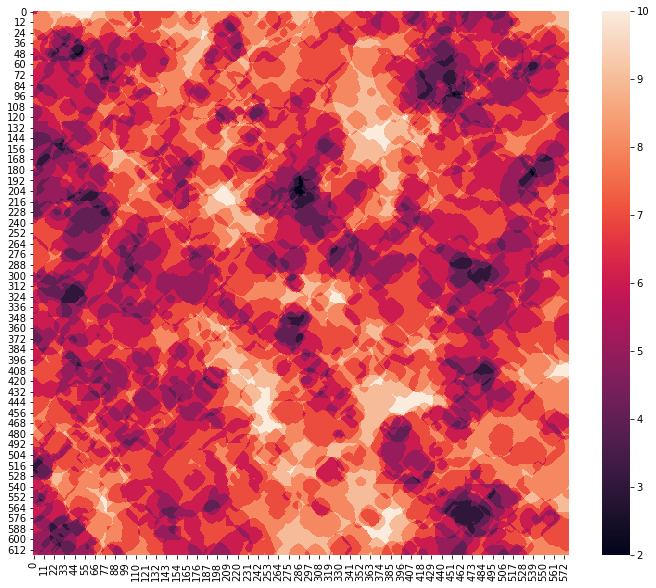

In [39]:
plt.figure(figsize = (12,10))
sns.heatmap(np.sum((1 - clouds), axis = (0)))

## What not to do



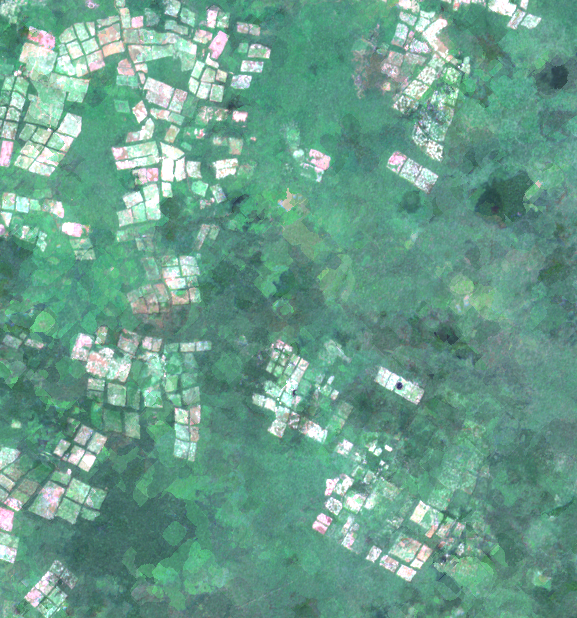


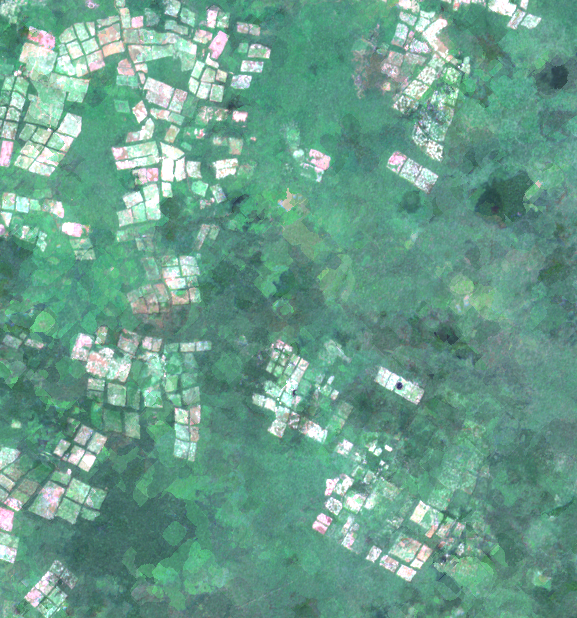

In [48]:
sentinel2[clouds == 1] = np.nan
s2_composite = np.nanmedian(sentinel2, axis = 0)
to_plot = []
ls = arr_to_rgb(s2_composite[..., :3][np.newaxis])

ipyplot.plot_images(ls, max_images=20, img_width=500)

# What we do


<img src="conafor/cloud_removal.gif" width="750" align="left">




Next, we take the irregularly-spaced cloud-free images and standardize them to a regular, one image per month temporal resolution by using the Whittaker smoother. The code to do so can be found [here](https://github.com/wri/sentinel-tree-cover/blob/master/src/preprocessing/whittaker_smoother.py).

<img src="conafor/smooth.png" width="1000" align="left">



<img src="conafor/sixyear_cloudfree.gif" width="750" align="left">

# Super-resolution of 20-meter bands to 10-meters

We utilize [DSen2](https://arxiv.org/pdf/1803.04271.pdf), a convolutional neural network, to super-resolve 20-meter bands to a 10-meter resolution. Our implementation of this is found [here](https://github.com/wri/sentinel-tree-cover/blob/master/src/download_and_predict_job_fast.py#L56). 

<img src="conafor/dsen2.png" width="750" align="left">





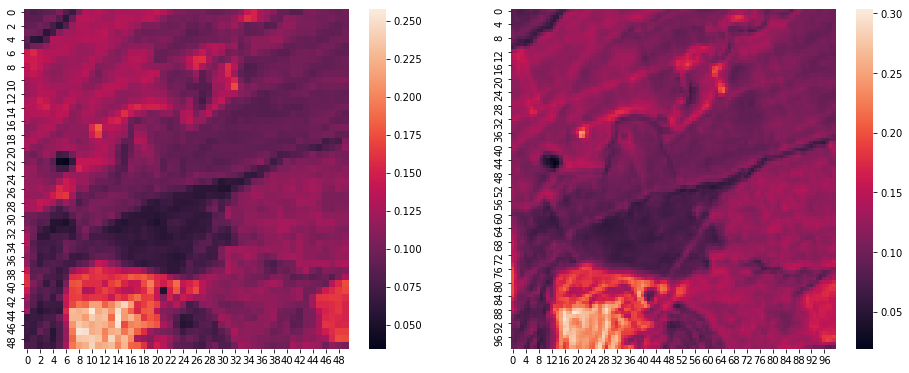

In [8]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(16,6.25))
sns.heatmap(sentinel2_20[0, :50, :50, 0], ax = ax1)
sns.heatmap(analysisready[0, :100, :100, 4], ax = ax2)

In [16]:
#import ipyplot
#to_plot = []
#ls = arr_to_rgb(analysisready[..., :3])
#ipyplot.plot_images(ls, max_images=20, img_width=400)

# Sentinel-1 preprocessing

We select the following pre-processing chain for Sentinel-1:
- VV, VH, gamma backscatter converted to db > -22
- monthly median of available Sentinel-1 images
- 30-meter Lee speckle filter

# Model overview


In comparison to **decision tree models**, which analyze a single point in time (or a composite) for each pixel indivudally, we use **temporal convolutional neural networks** which enable modeling of spatial and temporal patterns. All code for our model can be found [here on Gitub](https://github.com/wri/sentinel-tree-cover/blob/master/notebooks/4-model.ipynb)

<img src="conafor/decisiontree.png" width="750" align="left">





Convolutional neural networks apply a series of simple, linear models (y = mx + b) to 3 x 3 sections of the input. Because of this, layer *n* operates on *2n + 1* by *2n + 1* pixels (3, 5, 7, 9, 11, etc.). 

<img src="conafor/receptivefield.png" width="750" align="left">



This process can also be extended temporally, with input fed in as a "video" and the model learning complex patterns between "time steps" (images). This is what we do with our analysis-ready data. 

First, we analyze local (3 x 3 pixel) spatiotemporal patterns to model seasonality with a temporal (LSTM) convolutional layer.


```python
def gru_block(inp, length, size, flt, scope, train, normalize = True):
    '''Bidirectional convolutional GRU block with 
       zoneout and CSSE blocks in each time step

         Parameters:
          inp (tf.Variable): (B, T, H, W, C) layer
          length (tf.Variable): (B, T) layer denoting number of
                                steps per sample
          size (int): kernel size of convolution
          flt (int): number of convolution filters
          scope (str): tensorflow variable scope
          train (tf.Bool): flag to differentiate between train/test ops
          normalize (bool): whether to compute layer normalization

         Returns:
          gru (tf.Variable): (B, H, W, flt*2) bi-gru output
          steps (tf.Variable): (B, T, H, W, flt*2) output of each step
    '''
    with tf.variable_scope(scope):
        print(f"GRU input shape {inp.shape}, zoneout: {ZONE_OUT_PROB}")
        
        cell_fw = ConvGRUCell(shape = size, filters = flt,
                           kernel = [3, 3], padding = 'VALID', 
                           normalize = normalize, sse = True)
        cell_bw = ConvGRUCell(shape = size, filters = flt,
                           kernel = [3, 3], padding = 'VALID',
                           normalize = normalize, sse = True)
        
        cell_fw = ZoneoutWrapper(
           cell_fw, zoneout_drop_prob = ZONE_OUT_PROB, is_training = train)
        cell_bw = ZoneoutWrapper(
            cell_bw, zoneout_drop_prob = ZONE_OUT_PROB, is_training = train)
        steps, out = convGRU(inp, cell_fw, cell_bw, length)
        gru = tf.concat(out, axis = -1)
        steps = tf.concat(steps, axis = -1)
    return gru, steps

gru, steps = gru_block(inp = gru_input, length = length,
                                size = [28, 28],
                                flt = initial_flt // 2,
                                scope = 'down_16',
                                train = is_training)
```

## Non-temporal blocks

After analying small-scale temporal patterns, we expand our "receptive field" to incorporate "knowledge" about regions that are further away from a given pixel. To do so, we repeatedly apply a (modified) standard convolutional block.


```python
conv1 = conv_swish_gn(inp = pool1, is_training = is_training, stride = (1, 1),
            kernel_size = 3, scope = 'conv1', filters = mid_flt,
            keep_rate = keep_rate, activation = True, use_bias = False, norm = True,
            csse = True, dropblock = True, weight_decay = None)
```

<img src="conafor/Figure1a.png" width="750" align="left">
<img src="conafor/Figure1b.png" width="1100" align="left">

# Training the model

Once the model architecture has been defined (see the GitHub link above to review the full code), we create a "Graph" with which to train. This takes the uninitalized (just defined, not useable) layers, and randomly initializes them with random numbers. We also define our training and testing loss which we are optimizing.

```python
# We use the Adabound optimizer
optimizer = AdaBoundOptimizer(INITIAL_LR, ft_lr)
train_loss = bce_surface_loss(tf.reshape(labels, (-1, 14, 14, 1)), 
                         fm, weight = loss_weight, 
                         alpha = alpha, beta = beta_)

test_loss = bce_surface_loss(tf.reshape(labels, (-1, 14, 14, 1)),
                        fm, weight = loss_weight, 
                        alpha = alpha, beta = beta_)
update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)

with tf.control_dependencies(update_ops):
    train_op = optimizer.minimize(train_loss)   

# Create a saver to save the model each epoch
init_op = tf.global_variables_initializer()
sess.run(init_op)
saver = tf.train.Saver(max_to_keep = 150)
```

Finally, we iterate through our training data and train the model.

```python
for i in range(1, 50): # for 50 epochs
    train_ids = [x for x in range(len(train_y))]
    test_ids = [x for x in range(0, len(test_x))]
    
    randomize = equibatch(train_ids) # shuffles and reformats the train data
    print(f"starting epoch {i}")
    
    losses = []
    for k in tqdm.notebook.tnrange(int(len(randomize) // BATCH_SIZE)): # for each batch within one epoch
        batch_ids = randomize[k*BATCH_SIZE:(k+1)*BATCH_SIZE]
        x_batch, y_batch = augment_batch(batch_ids, BATCH_SIZE) #flips, augments the train data
        opt, tr = sess.run([train_op, train_loss],
                          feed_dict={inp: x_batch,
                                     length: np.full((BATCH_SIZE,), 12),
                                     labels: y_batch,
                                     is_training: True,
                                     loss_weight: 1.0,
                                     keep_rate: np.max(((1. - (i * 0.01)), MAX_DROPBLOCK)),
                                     alpha: al,
                                     beta_: be,
                                     })
        losses.append(tr)
    
```



# Analyzing the analysis-ready data with deployed tensorflow model


## Saving the model during training

```python
init_op = tf.global_variables_initializer()
sess.run(init_op)
saver = tf.train.Saver(max_to_keep = 150)
save_path = saver.save(sess, path)
```

## Converting the saved model to a deployable file


```python
model_path = '../../models/' # Your .meta file, output of tf.train.Saver
output_node_names = ['conv2d_13/Sigmoid']  # Output nodes

with tf.Session() as sess:
    # Restore the graph
    saver = tf.train.import_meta_graph(meta_path + "model.meta")

    # Load weights
    saver.restore(sess,tf.train.latest_checkpoint(meta_path))

# Freeze the graph
frozen_graph_def = tf.graph_util.convert_variables_to_constants(
    sess,
    sess.graph_def,
    output_node_names)
    
# Save the frozen graph
with open('../../models/predict_graph.pb', 'wb') as f:
    f.write(frozen_graph_def.SerializeToString())
```


## Loading and deploying the model

```python 
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
predict_graph_def = tf.compat.v1.GraphDef()
    
if os.path.exists(args.predict_model_path):
    print(f"Loading model from {args.predict_model_path}")
    predict_file = tf.io.gfile.GFile(args.predict_model_path + "predict_graph.pb", 'rb')
    predict_graph_def.ParseFromString(predict_file.read())
    predict_graph = tf.import_graph_def(predict_graph_def, name='predict')
    predict_sess = tf.compat.v1.Session(graph=predict_graph)
    predict_output = predict_sess.graph.get_tensor_by_name(f"predict/conv2d_13/Sigmoid:0") 
    predict_inp = predict_sess.graph.get_tensor_by_name("predict/Placeholder:0")
    predict_length = predict_sess.graph.get_tensor_by_name("predict/PlaceholderWithDefault:0")
    
    
sentinel = load_raw_sentinel(tile_path)
analysisready = process_sentinel(sentineL)
preds = predict_sess.run(predict_output, 
                 feed_dict={predict_inp:analysisready, predict_length:analysisready.shape[0]}
                )
```


## Writing the predictions to disk as a .tif

```python
import numpy as np
import rasterio
def write_tif(arr: np.ndarray,
              point: list,
              x: int,
              y: int,
              out_folder: str,
              suffix="_FINAL") -> str:

    file = out_folder + f"{str(x)}X{str(y)}Y{suffix}.tif"

    west, east = point[0], point[2]
    north, south = point[3], point[1]
    arr = arr.T.astype(np.uint8)

    transform = rasterio.transform.from_bounds(west=west,
                                               south=south,
                                               east=east,
                                               north=north,
                                               width=arr.shape[1],
                                               height=arr.shape[0])

    new_dataset = rasterio.open(file,
                                'w',
                                driver='GTiff',
                                height=arr.shape[0],
                                width=arr.shape[1],
                                count=1,
                                dtype="uint8",
                                compress='lzw',
                                crs='+proj=longlat +datum=WGS84 +no_defs',
                                transform=transform)
    new_dataset.write(arr, 1)
    new_dataset.close()
    return file
```

# 2017 to 2022 tree cover predictions

<img src="conafor/sixyear_predictions.gif" width="750" align="left">

<img src="conafor/sixyear_predictionsyucatan.gif" width="750" align="left">

<img src="conafor/yucatanchange.png" width="750" align="left">



# Training data labeling

We utilize [Collect Earth Online](collect.earth) to label our training data. We generate 140 x 140 meter sample plots with 10-meter spacing in-between each subplot. Pixels are marked 1 if a canopy intersects the subplot centroid, otherwise a 0.

<img src="conafor/trainingdata.png" width="750" align="left">
<img src="conafor/Figure2a.png" width="1000" align="left">






# Next steps

Currently, the tropical-scale, 2020 dataset is finished and available to view online. Within the next month or two, it will be available to analyze within Google Earth Engine, and to download and analyze via Global Forest Watch. The publication is in final review stages in Remote Sensing of Environment, and will be open source when fully published.

The annual change (gain + loss) is a prototype dataset that we are evaluating methodology for this year. We hope to make a pilot dataset for Yucatán (and many other areas of the tropics) this year and release a full change dataset sometime in 2024. We are happy to share prototype data as it is available, though at this time we cannot promise when this will be, as the research can have unexpected delays or reprioritization.

<img src="conafor/mexico.png" width="750" align="left">

# Take-away notes

**1.** The overall data processing pipeline looks a little like this:
    
```python
_ = download_raw_sentinel_2(tile_path)
sentinel = load_raw_sentinel(tile_path)
clouds_and_shadows = identify_clouds_shadows(sentinel)
analysisready = process_sentinel(sentinel, clouds_and_shadows) 
analysisready = superresolve(analysisready)

sentinel1 = download_raw_sentinel_1(tile_path)
sentinel1 = process_sentinel_1(sentinel1)

model_input = np.concatenate([sentinel, sentinel1], axis = -1)

preds = predict_sess.run(predict_output, 
                 feed_dict={predict_inp:model_input, predict_length:model_input.shape[0]}
                )
write_tif(preds)
```

**2.** In the upcoming 1-2 years, WRI will be releasing annual change detection products with this approach. We are currently piloting the data in Rwanda, Kenya, El Salvador, Costa Rica, and Yucatán, MX. We are happy to share early results when possible. 

**3.** While the demonstrated method here is not an early warning system as it is not near-real-time, many of the processing decisions made (image selection, cloud detection and removal, relative readiometric normalization, etc. are applicable to improving data quality in tropical dry forests. 
